<a href="https://colab.research.google.com/github/Roxxboi/GAN-face-generatation/blob/main/gan_big_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch 
from torch import nn
import numpy as np

import cv2
import torch.nn.functional as F
import math
import matplotlib.pyplot as plt

import torchvision
import torchvision.transforms as transforms

import matplotlib.image as mpimg

import tensorflow as tf
from tqdm import tqdm

In [ ]:
torch.manual_seed(111)

device = torch.device("cuda")

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount= True)

In [ ]:
import pathlib 
path = data_dir = pathlib.Path("/content/drive/MyDrive/face data/")
img_set = list(data_dir.glob('*'))
print(img_set)

image_set = list()

for i in img_set:
  image_set.append(cv2.cvtColor(cv2.imread(str(pathlib.Path(i))),cv2.COLOR_BGR2RGB))
  #img_2 = cv2.cvtColor(img_2,cv2.COLOR_BGR2RGB)

latent_size = 128

[PosixPath('/content/drive/MyDrive/face data/4401.jpg'), PosixPath('/content/drive/MyDrive/face data/4412.jpg'), PosixPath('/content/drive/MyDrive/face data/4407.jpg'), PosixPath('/content/drive/MyDrive/face data/4400.jpg'), PosixPath('/content/drive/MyDrive/face data/4409.jpg'), PosixPath('/content/drive/MyDrive/face data/4405.jpg'), PosixPath('/content/drive/MyDrive/face data/4417.jpg'), PosixPath('/content/drive/MyDrive/face data/4413.jpg'), PosixPath('/content/drive/MyDrive/face data/4399.jpg'), PosixPath('/content/drive/MyDrive/face data/4414.jpg'), PosixPath('/content/drive/MyDrive/face data/4411.jpg'), PosixPath('/content/drive/MyDrive/face data/4406.jpg'), PosixPath('/content/drive/MyDrive/face data/4415.jpg'), PosixPath('/content/drive/MyDrive/face data/4438.jpg'), PosixPath('/content/drive/MyDrive/face data/4433.jpg'), PosixPath('/content/drive/MyDrive/face data/4425.jpg'), PosixPath('/content/drive/MyDrive/face data/4427.jpg'), PosixPath('/content/drive/MyDrive/face data/442

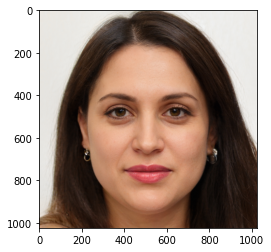

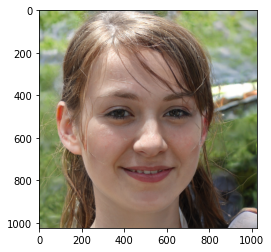

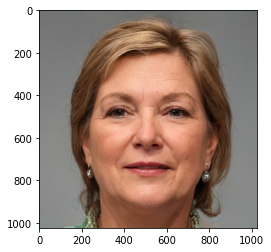

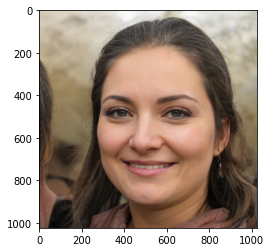

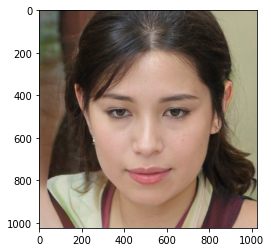

...

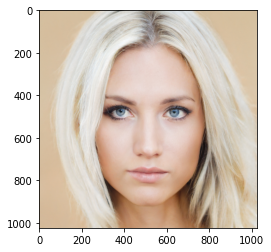

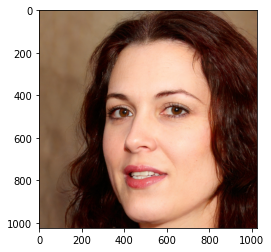

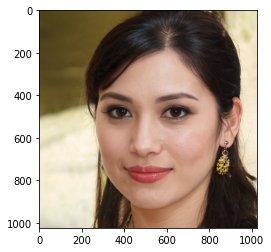

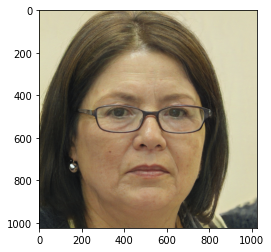

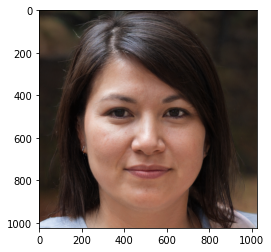

In [ ]:
for i in range(19):
  plt.imshow(image_set[i])
  plt.show()

In [ ]:
transform = transforms.Compose(
    [transforms.ToTensor(), transforms.Normalize(0, 1)]
)


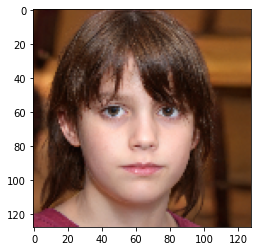

In [ ]:
train_set = list()
for i in image_set:
  i = cv2.resize(i,dsize = (128,128))
  train_set.append(transform(i))

plt.imshow(train_set[8].permute(1,2,0))





In [ ]:
batch_size = 128
train_dl = torch.utils.data.DataLoader(train_set,batch_size=batch_size, shuffle=True,)


In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(1024, 1, kernel_size=4, stride=1, padding=0, bias=False),
            
            nn.Flatten(),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.model(x)
        return x



In [ ]:
discriminator = Discriminator().to(device= device)


In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(latent_size, 1024, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(1024),
            nn.ReLU(True),
            #128 x 1024 x 4 x 4

            nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            #128 x 512 x 8 x 8

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            #128 x 256 x 16 x 16

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            #128 x 128 x 32 x 32

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            #128 x 64 x 64 x 64

            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
            #128 x 3 x 128 x 128
            nn.Tanh()
        )

    def forward(self, x):
        x = self.model(x)
        return x

    

In [ ]:
generator = Generator().to(device= device)

In [ ]:
lr = 0.0001
epochs = 300
loss_function = nn.BCELoss()



In [ ]:

def fit(epochs, lr_d, lr_g, start_idx=1):
    torch.cuda.empty_cache()
    
    losses_d = []
    losses_g = []
    real_scores = []
    fake_scores = []
    
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr_d, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr_g, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images in tqdm(train_dl):
            real_images = real_images.to(device)
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            loss_g = train_generator(opt_g)
            
        losses_d.append(loss_d)
        losses_g.append(loss_g)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        print("Epoch: {}, discriminator loss: {:.4f}, generator loss: {:.4f}".format(
        epoch, loss_d, loss_g))
        
        #save_sample(epoch+start_idx, fixed_latent, show=False)
        
    return losses_d, losses_g, real_scores, fake_scores

def train_discriminator(real_images, opt_d):
    opt_d.zero_grad()
    real_images = real_images.to(device)
    real_preds= discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    latent = torch.randn(latent_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    fake_preds= discriminator(fake_images)
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()
    
    loss = real_loss + fake_loss
    loss.backward(),
    opt_d.step()
    
    return loss.item(), real_score, fake_score

def train_generator(opt_g):
    opt_g.zero_grad()
    
    latent = torch.randn(latent_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    preds = discriminator(fake_images)
    targets = torch.ones(fake_images.size(0), 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    loss.backward(),
    opt_g.step()
    
    return loss.item()

fit(epochs, lr, lr, start_idx=1)

100%|██████████| 17/17 [00:27<00:00,  1.61s/it]


Epoch: 0, discriminator loss: 0.2314, generator loss: 3.3857


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 1, discriminator loss: 0.5453, generator loss: 4.6083


100%|██████████| 17/17 [00:26<00:00,  1.56s/it]


Epoch: 2, discriminator loss: 0.2321, generator loss: 5.4365


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 3, discriminator loss: 0.4213, generator loss: 4.4065


100%|██████████| 17/17 [00:27<00:00,  1.60s/it]


Epoch: 4, discriminator loss: 0.4736, generator loss: 2.0501


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 5, discriminator loss: 0.4686, generator loss: 2.0934


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 6, discriminator loss: 0.1174, generator loss: 4.7114


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 7, discriminator loss: 0.2120, generator loss: 4.7589


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 8, discriminator loss: 0.2036, generator loss: 2.3425


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 9, discriminator loss: 0.2356, generator loss: 4.4593


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 10, discriminator loss: 1.1454, generator loss: 3.5493


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 11, discriminator loss: 1.2046, generator loss: 5.1955


100%|██████████| 17/17 [00:26<00:00,  1.54s/it]


Epoch: 12, discriminator loss: 0.7083, generator loss: 9.3804


100%|██████████| 17/17 [00:26<00:00,  1.57s/it]


Epoch: 13, discriminator loss: 1.7288, generator loss: 12.0369


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 14, discriminator loss: 0.2955, generator loss: 6.5064


100%|██████████| 17/17 [00:25<00:00,  1.53s/it]


Epoch: 15, discriminator loss: 0.3591, generator loss: 5.6255


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 16, discriminator loss: 1.4052, generator loss: 13.3391


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 17, discriminator loss: 0.2613, generator loss: 3.9935


100%|██████████| 17/17 [00:26<00:00,  1.56s/it]


Epoch: 18, discriminator loss: 0.2528, generator loss: 4.8636


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 19, discriminator loss: 0.1979, generator loss: 4.9630


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 20, discriminator loss: 1.2098, generator loss: 8.0208


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 21, discriminator loss: 0.3198, generator loss: 7.4694


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 22, discriminator loss: 0.5701, generator loss: 9.0321


100%|██████████| 17/17 [00:26<00:00,  1.54s/it]


Epoch: 23, discriminator loss: 0.1442, generator loss: 5.4782


100%|██████████| 17/17 [00:25<00:00,  1.52s/it]


Epoch: 24, discriminator loss: 0.1799, generator loss: 3.0646


100%|██████████| 17/17 [00:25<00:00,  1.53s/it]


Epoch: 25, discriminator loss: 0.2826, generator loss: 5.1552


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 26, discriminator loss: 0.1855, generator loss: 4.2337


100%|██████████| 17/17 [00:25<00:00,  1.52s/it]


Epoch: 27, discriminator loss: 0.3055, generator loss: 6.8221


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 28, discriminator loss: 0.4050, generator loss: 1.2687


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 29, discriminator loss: 0.1633, generator loss: 5.2057


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 30, discriminator loss: 0.2849, generator loss: 4.2981


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 31, discriminator loss: 0.2459, generator loss: 7.8347


100%|██████████| 17/17 [00:26<00:00,  1.56s/it]


Epoch: 32, discriminator loss: 0.2477, generator loss: 5.2825


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 33, discriminator loss: 0.1351, generator loss: 5.6416


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 34, discriminator loss: 0.1446, generator loss: 7.1539


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 35, discriminator loss: 0.1676, generator loss: 4.0432


100%|██████████| 17/17 [00:26<00:00,  1.56s/it]


Epoch: 36, discriminator loss: 0.1431, generator loss: 4.4865


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 37, discriminator loss: 0.2527, generator loss: 4.9786


100%|██████████| 17/17 [00:26<00:00,  1.54s/it]


Epoch: 38, discriminator loss: 0.8771, generator loss: 6.9933


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 39, discriminator loss: 0.2476, generator loss: 3.7331


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 40, discriminator loss: 0.1952, generator loss: 5.5498


100%|██████████| 17/17 [00:26<00:00,  1.54s/it]


Epoch: 41, discriminator loss: 0.1867, generator loss: 4.2349


100%|██████████| 17/17 [00:25<00:00,  1.53s/it]


Epoch: 42, discriminator loss: 0.1219, generator loss: 4.9028


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 43, discriminator loss: 0.1822, generator loss: 4.6159


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 44, discriminator loss: 0.2605, generator loss: 6.5227


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 45, discriminator loss: 0.3106, generator loss: 4.5962


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 46, discriminator loss: 0.1102, generator loss: 5.6256


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 47, discriminator loss: 0.2355, generator loss: 3.0822


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 48, discriminator loss: 0.4044, generator loss: 6.2132


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 49, discriminator loss: 0.2088, generator loss: 3.7494


100%|██████████| 17/17 [00:25<00:00,  1.52s/it]


Epoch: 50, discriminator loss: 0.1462, generator loss: 5.2561


100%|██████████| 17/17 [00:26<00:00,  1.54s/it]


Epoch: 51, discriminator loss: 0.1269, generator loss: 5.4960


100%|██████████| 17/17 [00:26<00:00,  1.57s/it]


Epoch: 52, discriminator loss: 0.1767, generator loss: 3.9343


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 53, discriminator loss: 0.1369, generator loss: 4.5051


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 54, discriminator loss: 3.5380, generator loss: 6.9483


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 55, discriminator loss: 0.2865, generator loss: 2.6073


100%|██████████| 17/17 [00:26<00:00,  1.54s/it]


Epoch: 56, discriminator loss: 0.4441, generator loss: 8.0671


100%|██████████| 17/17 [00:25<00:00,  1.52s/it]


Epoch: 57, discriminator loss: 0.2563, generator loss: 2.8152


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 58, discriminator loss: 0.2613, generator loss: 5.2681


100%|██████████| 17/17 [00:26<00:00,  1.54s/it]


Epoch: 59, discriminator loss: 0.5461, generator loss: 6.7880


100%|██████████| 17/17 [00:26<00:00,  1.53s/it]


Epoch: 60, discriminator loss: 0.1765, generator loss: 3.9503


100%|██████████| 17/17 [00:25<00:00,  1.53s/it]


Epoch: 61, discriminator loss: 0.0830, generator loss: 11.6406


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 62, discriminator loss: 0.2074, generator loss: 6.1346


100%|██████████| 17/17 [00:25<00:00,  1.52s/it]


Epoch: 63, discriminator loss: 0.0626, generator loss: 5.3693


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 64, discriminator loss: 0.1846, generator loss: 3.4709


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 65, discriminator loss: 0.0807, generator loss: 8.7330


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 66, discriminator loss: 0.2106, generator loss: 2.7462


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 67, discriminator loss: 0.5666, generator loss: 0.4306


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 68, discriminator loss: 0.1557, generator loss: 4.4901


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 70, discriminator loss: 0.1381, generator loss: 4.2492


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 71, discriminator loss: 0.3862, generator loss: 1.6214


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 72, discriminator loss: 0.1143, generator loss: 4.9411


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 73, discriminator loss: 0.8904, generator loss: 14.0557


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 74, discriminator loss: 0.0952, generator loss: 6.7656


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 75, discriminator loss: 0.5123, generator loss: 3.4980


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 76, discriminator loss: 0.0853, generator loss: 4.0573


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 77, discriminator loss: 0.1235, generator loss: 5.6280


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 78, discriminator loss: 0.0690, generator loss: 4.8842


100%|██████████| 17/17 [00:25<00:00,  1.52s/it]


Epoch: 79, discriminator loss: 0.1032, generator loss: 5.3628


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 80, discriminator loss: 0.1375, generator loss: 3.9862


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 81, discriminator loss: 0.1914, generator loss: 6.7461


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 82, discriminator loss: 0.5064, generator loss: 11.0318


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 83, discriminator loss: 0.1084, generator loss: 5.9432


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 84, discriminator loss: 0.1591, generator loss: 3.9445


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 85, discriminator loss: 0.3502, generator loss: 5.1587


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 86, discriminator loss: 0.1323, generator loss: 5.2039


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 87, discriminator loss: 0.4523, generator loss: 2.5935


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 88, discriminator loss: 0.1869, generator loss: 2.7839


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 89, discriminator loss: 0.2849, generator loss: 6.5168


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 90, discriminator loss: 0.2441, generator loss: 3.1953


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 91, discriminator loss: 0.2444, generator loss: 2.8571


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 92, discriminator loss: 0.6292, generator loss: 12.4330


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 93, discriminator loss: 0.1600, generator loss: 4.8400


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 94, discriminator loss: 0.0963, generator loss: 4.2495


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 95, discriminator loss: 0.2096, generator loss: 5.9338


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 96, discriminator loss: 0.0719, generator loss: 4.6978


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 97, discriminator loss: 0.1635, generator loss: 4.6961


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 98, discriminator loss: 0.0413, generator loss: 3.8598


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 99, discriminator loss: 0.1747, generator loss: 3.8175


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 100, discriminator loss: 0.1955, generator loss: 6.4279


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 101, discriminator loss: 0.1256, generator loss: 5.3976


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 102, discriminator loss: 1.0987, generator loss: 0.3502


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 103, discriminator loss: 0.1962, generator loss: 7.9679


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 104, discriminator loss: 0.2864, generator loss: 2.6053


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 105, discriminator loss: 0.5335, generator loss: 9.4690


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 106, discriminator loss: 0.5628, generator loss: 1.9921


100%|██████████| 17/17 [00:24<00:00,  1.46s/it]


Epoch: 107, discriminator loss: 0.2253, generator loss: 3.2874


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 108, discriminator loss: 0.1036, generator loss: 5.6718


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 109, discriminator loss: 0.1995, generator loss: 4.2619


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 110, discriminator loss: 1.9410, generator loss: 15.4051


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 111, discriminator loss: 0.2312, generator loss: 3.4881


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 112, discriminator loss: 0.1372, generator loss: 4.8376


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 113, discriminator loss: 0.0783, generator loss: 4.6572


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 114, discriminator loss: 0.1605, generator loss: 3.8956


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 115, discriminator loss: 0.1783, generator loss: 5.8006


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 116, discriminator loss: 0.9184, generator loss: 11.4552


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 117, discriminator loss: 0.4421, generator loss: 5.3319


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 118, discriminator loss: 0.0610, generator loss: 3.6951


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 119, discriminator loss: 0.1986, generator loss: 4.8253


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 120, discriminator loss: 0.2923, generator loss: 6.1878


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 121, discriminator loss: 0.1356, generator loss: 6.0691


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 122, discriminator loss: 0.1411, generator loss: 5.9367


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 123, discriminator loss: 0.0866, generator loss: 5.3336


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 124, discriminator loss: 0.2574, generator loss: 1.5116


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 125, discriminator loss: 0.2277, generator loss: 2.9651


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 126, discriminator loss: 0.1294, generator loss: 4.1431


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 127, discriminator loss: 0.0534, generator loss: 5.4206


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 128, discriminator loss: 0.0657, generator loss: 6.4295


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 129, discriminator loss: 0.1422, generator loss: 3.8833


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 130, discriminator loss: 0.0936, generator loss: 4.3600


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 131, discriminator loss: 0.0981, generator loss: 3.5286


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 132, discriminator loss: 0.0354, generator loss: 4.8880


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 133, discriminator loss: 0.0863, generator loss: 6.4132


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 134, discriminator loss: 0.0599, generator loss: 7.0479


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 135, discriminator loss: 0.1870, generator loss: 6.4822


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 136, discriminator loss: 0.1245, generator loss: 4.1635


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 137, discriminator loss: 0.0500, generator loss: 4.1113


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 138, discriminator loss: 0.0726, generator loss: 5.4383


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 139, discriminator loss: 0.1227, generator loss: 4.6678


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 140, discriminator loss: 0.4080, generator loss: 0.4678


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 141, discriminator loss: 0.1459, generator loss: 4.1359


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 142, discriminator loss: 0.1425, generator loss: 4.2958


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 143, discriminator loss: 0.1662, generator loss: 4.8017


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 144, discriminator loss: 0.4728, generator loss: 6.0694


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 145, discriminator loss: 0.1977, generator loss: 4.7614


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 146, discriminator loss: 0.2032, generator loss: 3.1156


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 147, discriminator loss: 0.0751, generator loss: 8.9788


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 148, discriminator loss: 0.1254, generator loss: 4.9935


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 149, discriminator loss: 0.3533, generator loss: 4.7636


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 150, discriminator loss: 0.0626, generator loss: 5.0145


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 151, discriminator loss: 0.0766, generator loss: 4.5185


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 152, discriminator loss: 0.1775, generator loss: 4.8751


100%|██████████| 17/17 [00:24<00:00,  1.46s/it]


Epoch: 153, discriminator loss: 0.1157, generator loss: 5.4687


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 154, discriminator loss: 0.1144, generator loss: 3.6868


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 155, discriminator loss: 0.1157, generator loss: 3.8507


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 156, discriminator loss: 0.0780, generator loss: 5.1554


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 157, discriminator loss: 0.1426, generator loss: 5.6718


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 158, discriminator loss: 0.1863, generator loss: 3.9587


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 159, discriminator loss: 0.8120, generator loss: 15.5092


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 160, discriminator loss: 0.1669, generator loss: 3.4113


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 161, discriminator loss: 0.0412, generator loss: 7.0216


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 162, discriminator loss: 0.1130, generator loss: 5.9646


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 163, discriminator loss: 0.1392, generator loss: 4.9222


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 164, discriminator loss: 0.1390, generator loss: 3.4092


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 165, discriminator loss: 0.1137, generator loss: 4.3695


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 166, discriminator loss: 0.2562, generator loss: 8.2282


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 167, discriminator loss: 0.0908, generator loss: 4.5535


100%|██████████| 17/17 [00:24<00:00,  1.46s/it]


Epoch: 168, discriminator loss: 0.5153, generator loss: 1.1644


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 169, discriminator loss: 0.1917, generator loss: 6.8900


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 170, discriminator loss: 0.1509, generator loss: 6.2673


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 171, discriminator loss: 0.1796, generator loss: 6.3097


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 172, discriminator loss: 0.1193, generator loss: 4.4162


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 173, discriminator loss: 0.1059, generator loss: 5.1081


100%|██████████| 17/17 [00:24<00:00,  1.46s/it]


Epoch: 174, discriminator loss: 0.5833, generator loss: 13.4548


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 175, discriminator loss: 0.2473, generator loss: 4.7262


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 176, discriminator loss: 0.0813, generator loss: 5.2263


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 177, discriminator loss: 0.3015, generator loss: 7.3106


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 178, discriminator loss: 0.1272, generator loss: 4.6084


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 179, discriminator loss: 0.0875, generator loss: 5.5589


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 180, discriminator loss: 0.1991, generator loss: 3.6893


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 181, discriminator loss: 0.1254, generator loss: 5.4639


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 182, discriminator loss: 0.1739, generator loss: 5.4078


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 183, discriminator loss: 0.1803, generator loss: 2.5868


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 184, discriminator loss: 0.0783, generator loss: 4.6405


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 185, discriminator loss: 0.1585, generator loss: 5.8933


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 186, discriminator loss: 0.2520, generator loss: 2.4954


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 187, discriminator loss: 0.1204, generator loss: 5.1317


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 188, discriminator loss: 0.0349, generator loss: 5.0328


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 189, discriminator loss: 0.0445, generator loss: 6.3008


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 190, discriminator loss: 0.2170, generator loss: 10.1567


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 191, discriminator loss: 0.2805, generator loss: 7.6614


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 192, discriminator loss: 0.0365, generator loss: 7.5950


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 193, discriminator loss: 0.0498, generator loss: 7.1050


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 194, discriminator loss: 0.1001, generator loss: 3.0831


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 195, discriminator loss: 0.0779, generator loss: 5.3522


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 196, discriminator loss: 0.0538, generator loss: 6.6074


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 197, discriminator loss: 1.4609, generator loss: 12.0884


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 198, discriminator loss: 0.0583, generator loss: 4.0954


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 199, discriminator loss: 0.0406, generator loss: 6.2685


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 200, discriminator loss: 0.0604, generator loss: 5.3536


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 201, discriminator loss: 0.0772, generator loss: 6.1199


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 202, discriminator loss: 0.0904, generator loss: 4.7845


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 203, discriminator loss: 0.1025, generator loss: 5.9895


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 204, discriminator loss: 0.0936, generator loss: 4.4056


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 205, discriminator loss: 0.2947, generator loss: 4.3883


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 206, discriminator loss: 0.1465, generator loss: 7.9912


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 207, discriminator loss: 0.1247, generator loss: 6.8973


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 208, discriminator loss: 0.0978, generator loss: 6.3720


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 209, discriminator loss: 0.1946, generator loss: 3.2395


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 210, discriminator loss: 0.0361, generator loss: 5.9601


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 211, discriminator loss: 0.2823, generator loss: 2.4023


100%|██████████| 17/17 [00:24<00:00,  1.46s/it]


Epoch: 212, discriminator loss: 0.1488, generator loss: 5.2865


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 213, discriminator loss: 0.1141, generator loss: 2.5446


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 214, discriminator loss: 0.0634, generator loss: 5.5227


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 215, discriminator loss: 0.0266, generator loss: 5.7108


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 216, discriminator loss: 0.0972, generator loss: 7.5964


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 217, discriminator loss: 0.1569, generator loss: 5.3928


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 218, discriminator loss: 0.0486, generator loss: 5.1676


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 219, discriminator loss: 0.1361, generator loss: 3.7547


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 220, discriminator loss: 0.0347, generator loss: 6.0693


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 221, discriminator loss: 0.0793, generator loss: 4.5916


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 222, discriminator loss: 0.1860, generator loss: 6.7304


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 223, discriminator loss: 0.1474, generator loss: 4.7381


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 224, discriminator loss: 0.1374, generator loss: 3.9635


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 225, discriminator loss: 0.0261, generator loss: 5.4361


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 226, discriminator loss: 0.0461, generator loss: 5.5377


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 227, discriminator loss: 0.2137, generator loss: 5.0944


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 228, discriminator loss: 4.3065, generator loss: 17.1558


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 229, discriminator loss: 0.1082, generator loss: 6.2626


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 230, discriminator loss: 0.0205, generator loss: 7.3775


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 231, discriminator loss: 0.0870, generator loss: 5.2603


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 232, discriminator loss: 0.1093, generator loss: 5.8273


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 233, discriminator loss: 0.2356, generator loss: 7.9474


100%|██████████| 17/17 [00:24<00:00,  1.46s/it]


Epoch: 234, discriminator loss: 0.0983, generator loss: 5.5626


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 235, discriminator loss: 0.0620, generator loss: 4.8539


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 236, discriminator loss: 0.0325, generator loss: 5.9943


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 237, discriminator loss: 0.0383, generator loss: 5.3988


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 238, discriminator loss: 0.0396, generator loss: 4.5786


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 239, discriminator loss: 0.0814, generator loss: 6.2718


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 240, discriminator loss: 0.1958, generator loss: 5.1067


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 241, discriminator loss: 0.0540, generator loss: 5.8744


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 242, discriminator loss: 0.0799, generator loss: 5.3713


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 243, discriminator loss: 0.0285, generator loss: 6.7754


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 244, discriminator loss: 0.1993, generator loss: 8.9242


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 245, discriminator loss: 0.1083, generator loss: 3.6841


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 246, discriminator loss: 0.0354, generator loss: 4.8454


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 247, discriminator loss: 0.0906, generator loss: 3.8856


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 248, discriminator loss: 0.0778, generator loss: 5.4552


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 249, discriminator loss: 0.0833, generator loss: 4.5052


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 250, discriminator loss: 0.1171, generator loss: 3.3868


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 251, discriminator loss: 0.2062, generator loss: 9.5214


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 252, discriminator loss: 0.0930, generator loss: 5.1762


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 253, discriminator loss: 0.1946, generator loss: 4.7943


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 254, discriminator loss: 0.0903, generator loss: 5.8816


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 255, discriminator loss: 0.0782, generator loss: 4.8184


100%|██████████| 17/17 [00:25<00:00,  1.51s/it]


Epoch: 256, discriminator loss: 0.0843, generator loss: 4.2518


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 257, discriminator loss: 0.0385, generator loss: 6.1589


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 258, discriminator loss: 0.1144, generator loss: 8.7401


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 259, discriminator loss: 0.0555, generator loss: 4.1894


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 260, discriminator loss: 0.0498, generator loss: 4.9875


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 261, discriminator loss: 0.1133, generator loss: 6.1769


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 262, discriminator loss: 0.0513, generator loss: 6.2143


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 263, discriminator loss: 0.0733, generator loss: 6.4182


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 264, discriminator loss: 0.0861, generator loss: 6.1413


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 265, discriminator loss: 0.0289, generator loss: 6.1807


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 266, discriminator loss: 0.0886, generator loss: 4.0408


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 267, discriminator loss: 0.0669, generator loss: 5.0442


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 268, discriminator loss: 0.0704, generator loss: 8.5119


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 269, discriminator loss: 0.1230, generator loss: 7.4507


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 270, discriminator loss: 0.0632, generator loss: 6.8852


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 271, discriminator loss: 0.0621, generator loss: 5.4955


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 272, discriminator loss: 0.0304, generator loss: 5.4810


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 273, discriminator loss: 0.1202, generator loss: 7.7224


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 274, discriminator loss: 0.1023, generator loss: 5.3050


100%|██████████| 17/17 [00:24<00:00,  1.46s/it]


Epoch: 275, discriminator loss: 0.1277, generator loss: 9.7667


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 276, discriminator loss: 0.0651, generator loss: 4.5318


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 277, discriminator loss: 0.0255, generator loss: 6.4537


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 278, discriminator loss: 0.1343, generator loss: 7.7162


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 279, discriminator loss: 0.0351, generator loss: 5.9569


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 280, discriminator loss: 0.0490, generator loss: 4.8424


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 281, discriminator loss: 0.0402, generator loss: 5.6969


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 282, discriminator loss: 0.1037, generator loss: 6.4701


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 283, discriminator loss: 0.0799, generator loss: 6.9650


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 284, discriminator loss: 0.0610, generator loss: 5.0273


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 285, discriminator loss: 0.1691, generator loss: 3.4170


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 286, discriminator loss: 0.0324, generator loss: 6.0909


100%|██████████| 17/17 [00:25<00:00,  1.50s/it]


Epoch: 287, discriminator loss: 0.1131, generator loss: 5.6455


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 288, discriminator loss: 0.0345, generator loss: 7.5258


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 289, discriminator loss: 0.0967, generator loss: 4.1950


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 290, discriminator loss: 0.0690, generator loss: 4.0976


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 291, discriminator loss: 0.0859, generator loss: 9.9135


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 292, discriminator loss: 0.0250, generator loss: 6.0297


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 293, discriminator loss: 1.1261, generator loss: 7.9281


100%|██████████| 17/17 [00:25<00:00,  1.49s/it]


Epoch: 294, discriminator loss: 0.1601, generator loss: 8.4165


100%|██████████| 17/17 [00:25<00:00,  1.48s/it]


Epoch: 295, discriminator loss: 0.0916, generator loss: 5.6878


100%|██████████| 17/17 [00:25<00:00,  1.47s/it]


Epoch: 296, discriminator loss: 0.0594, generator loss: 6.3870


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 297, discriminator loss: 0.0418, generator loss: 6.1682


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]


Epoch: 298, discriminator loss: 0.0513, generator loss: 6.1768


100%|██████████| 17/17 [00:24<00:00,  1.47s/it]

Epoch: 299, discriminator loss: 0.0649, generator loss: 6.3300


([0.23136022686958313,
  0.5452844500541687,
  0.2320745885372162,
  0.4213317930698395,
  0.47357121109962463,
  0.4686454236507416,
  0.11740394681692123,
  0.2119518667459488,
  0.20359240472316742,
  0.23563045263290405,
  1.1454395055770874,
  1.2046226263046265,
  0.7082926034927368,
  1.7287663221359253,
  0.2955302298069,
  0.3590773940086365,
  1.4051918983459473,
  0.26131850481033325,
  0.25282996892929077,
  0.19792945683002472,
  1.2097740173339844,
  0.3198392689228058,
  0.570121705532074,
  0.14421769976615906,
  0.17991596460342407,
  0.28262245655059814,
  0.18551501631736755,
  0.3054511845111847,
  0.40500372648239136,
  0.1632954329252243,
  0.2848917245864868,
  0.24585619568824768,
  0.24767476320266724,
  0.13514411449432373,
  0.1446308046579361,
  0.16759097576141357,
  0.1431298553943634,
  0.25274014472961426,
  0.877094566822052,
  0.24759846925735474,
  0.19522561132907867,
  0.1866910308599472,
  0.1219312846660614,
  0.182169571518898,
  0.26047036051750

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


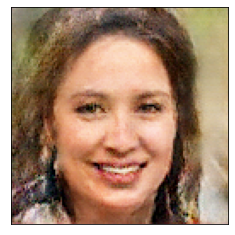

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


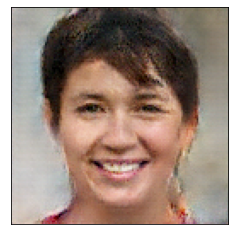

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


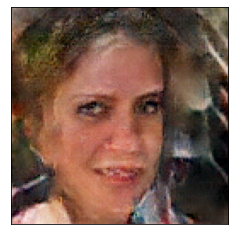

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


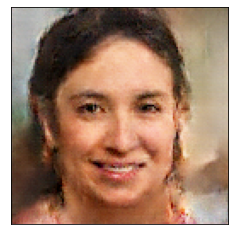

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


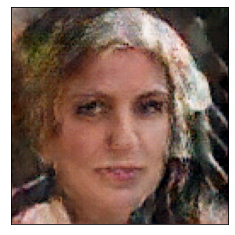

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


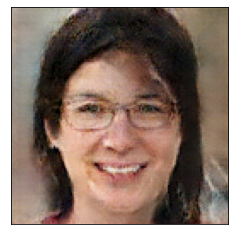

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


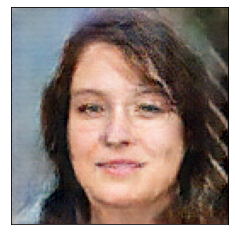

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


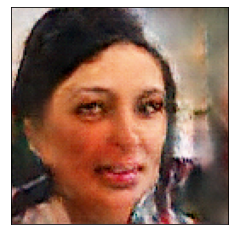

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


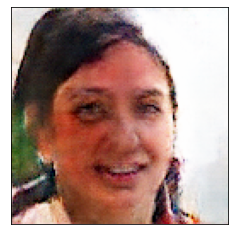

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


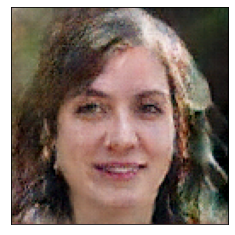

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


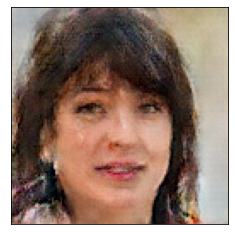

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


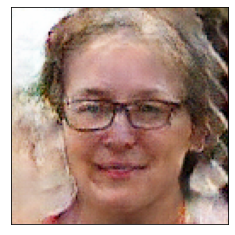

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


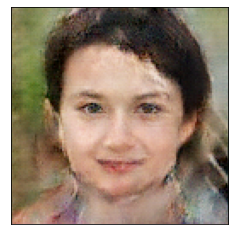

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


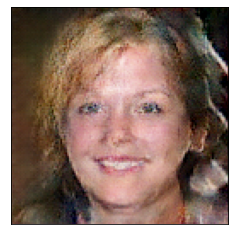

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


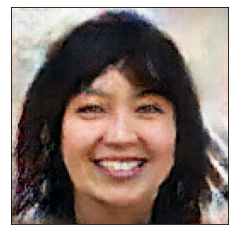

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


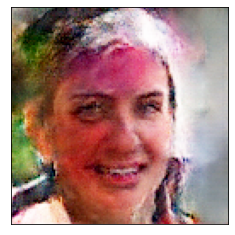

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


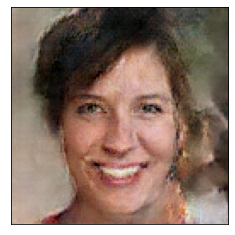

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


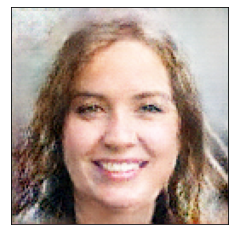

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


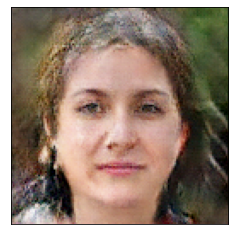

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


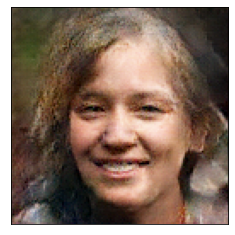

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


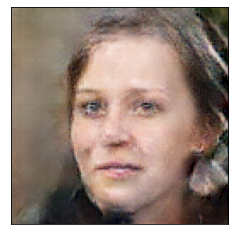

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


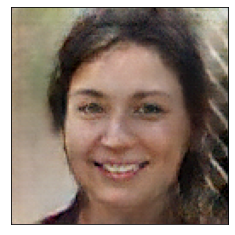

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


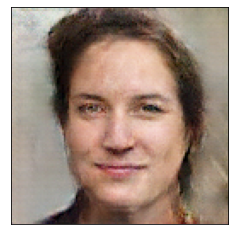

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


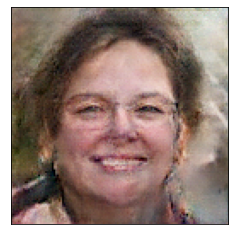

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


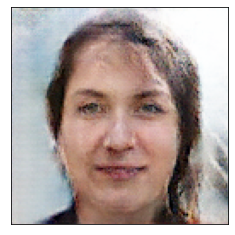

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


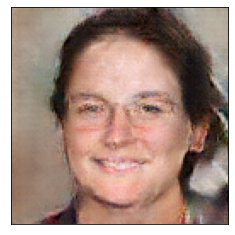

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


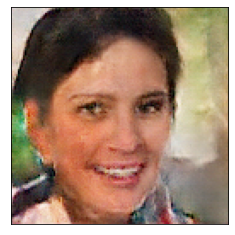

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


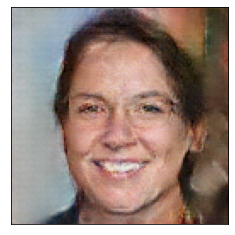

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


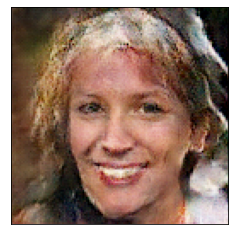

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


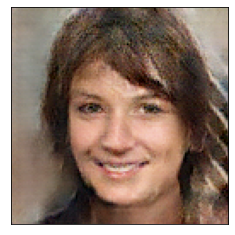

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


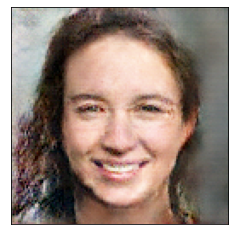

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


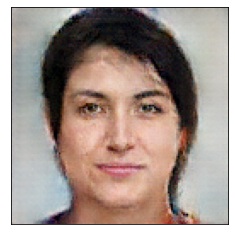

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


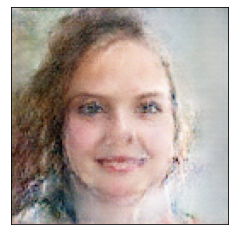

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


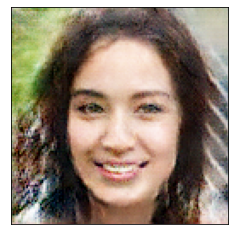

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


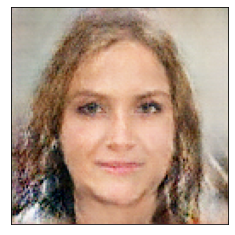

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


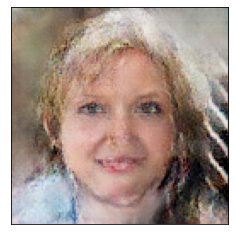

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


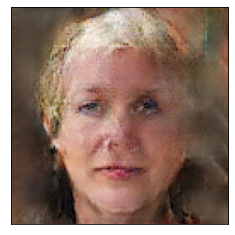

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


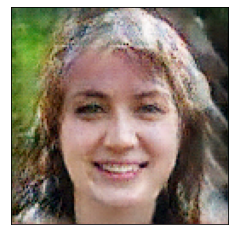

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


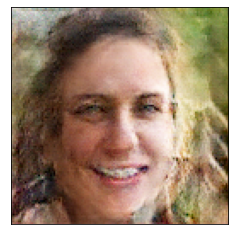

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


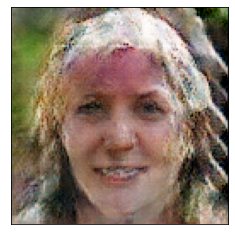

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


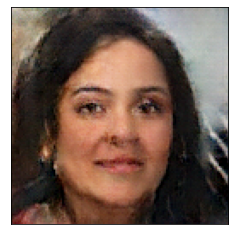

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


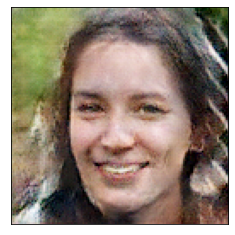

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


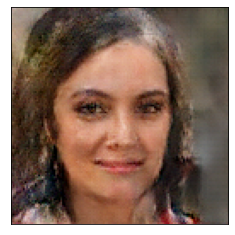

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


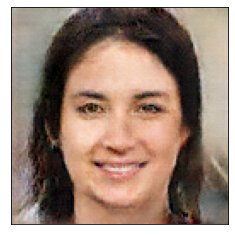

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


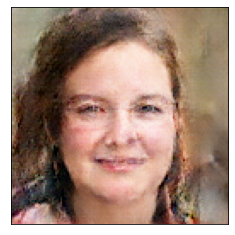

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


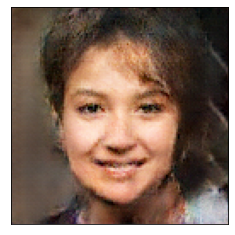

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


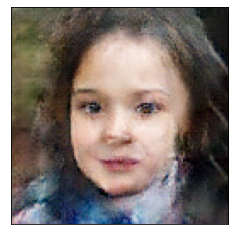

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


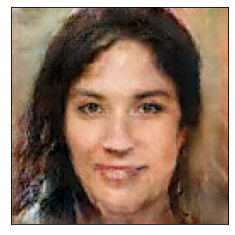

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


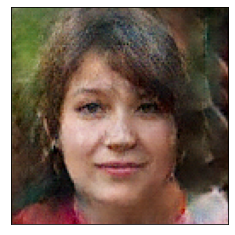

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


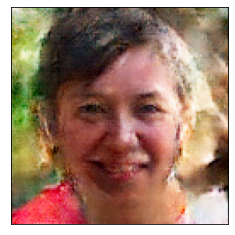

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


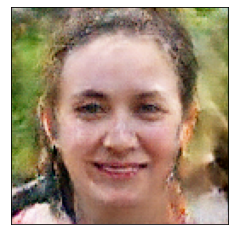

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


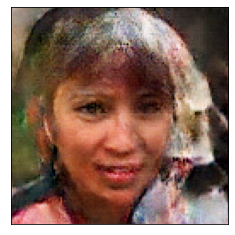

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


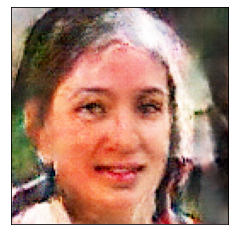

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


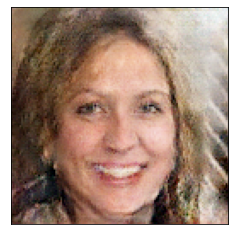

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


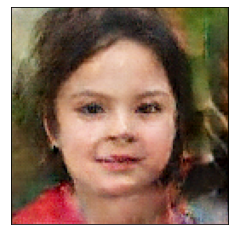

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


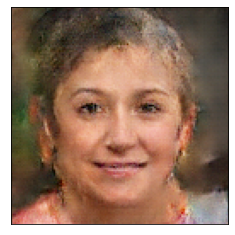

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


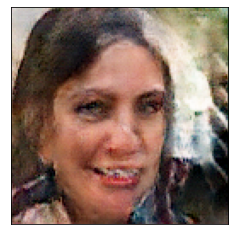

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


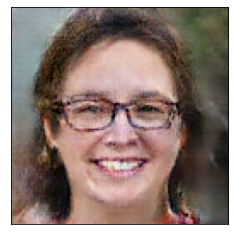

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


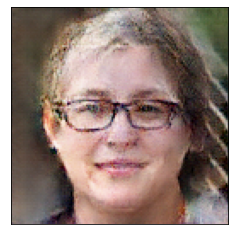

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


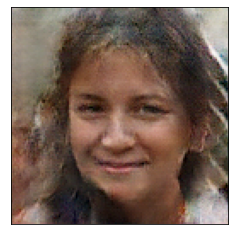

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


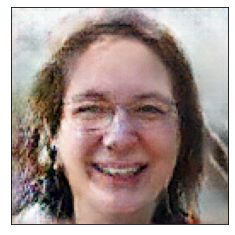

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


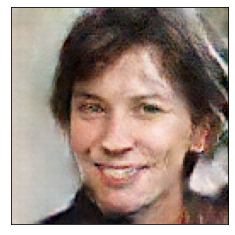

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


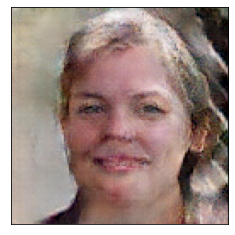

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


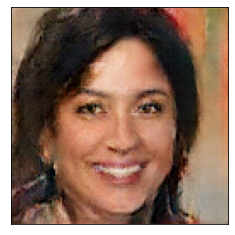

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


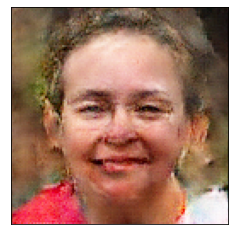

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


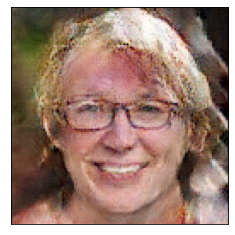

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


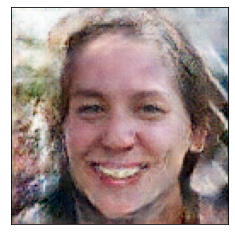

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


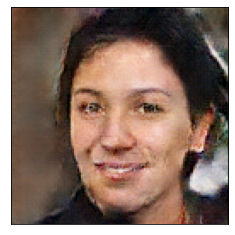

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


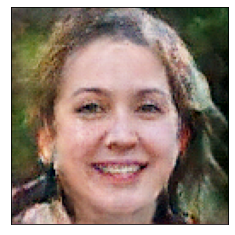

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


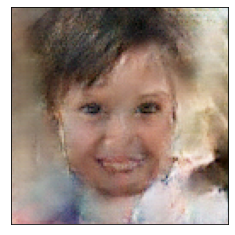

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


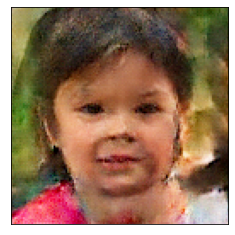

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


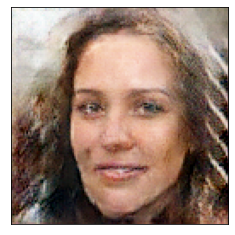

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


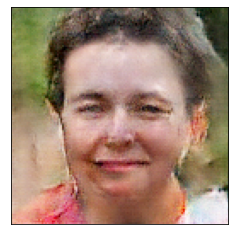

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


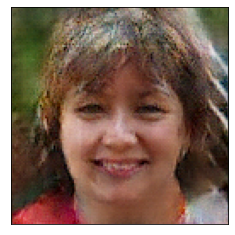

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


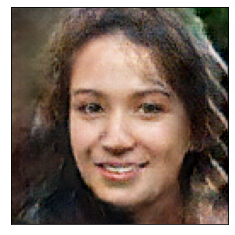

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


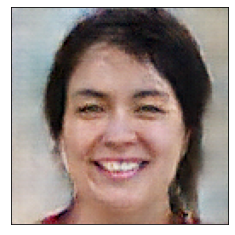

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


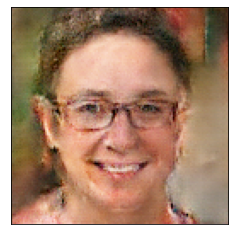

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


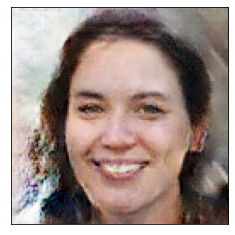

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


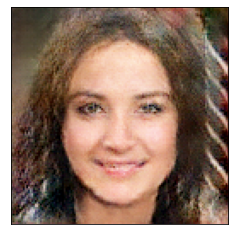

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


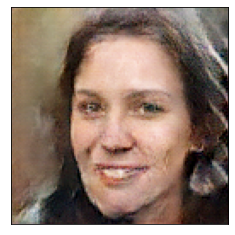

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


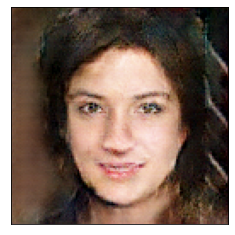

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


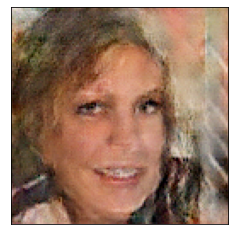

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


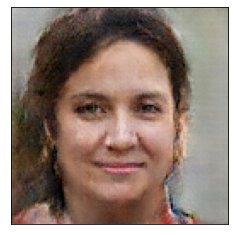

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


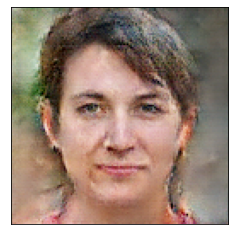

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


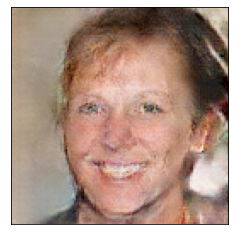

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


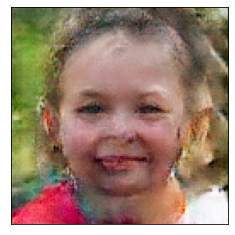

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


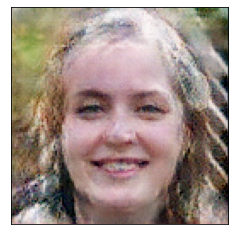

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


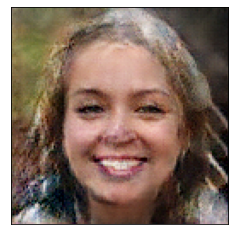

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


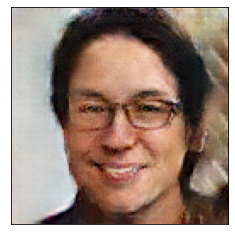

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


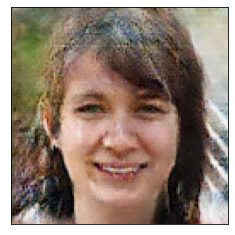

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


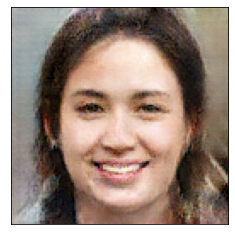

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


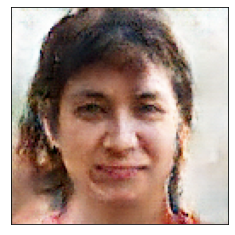

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


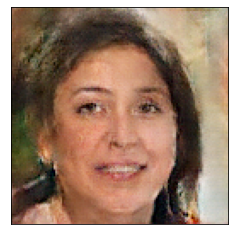

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


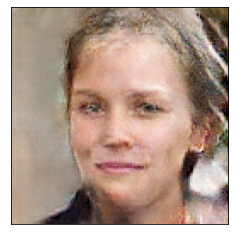

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


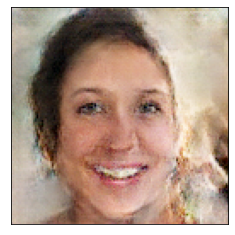

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


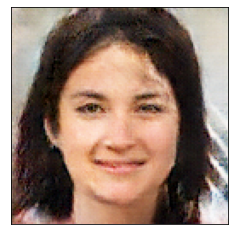

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


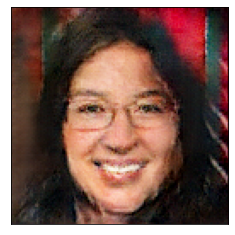

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


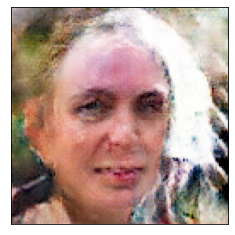

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


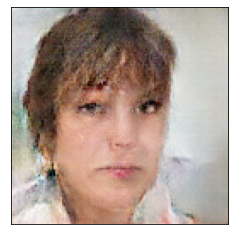

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


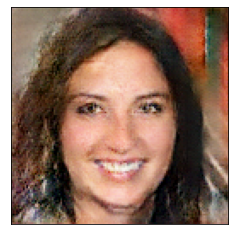

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


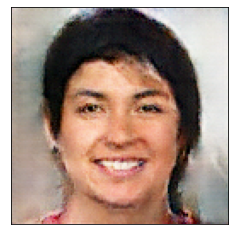

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


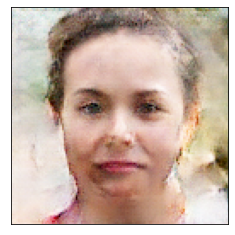

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


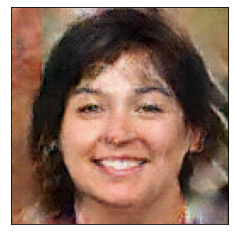

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


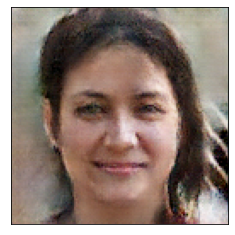

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


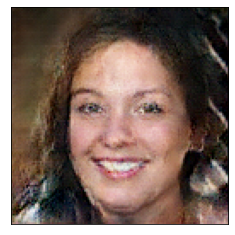

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


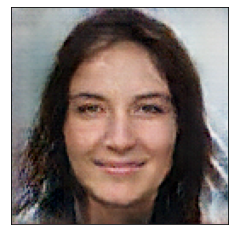

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


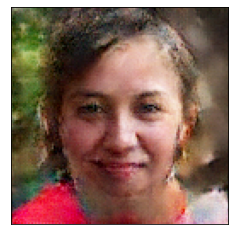

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


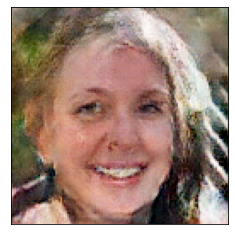

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


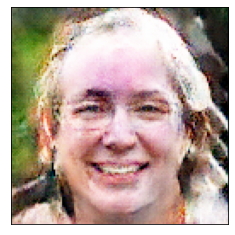

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


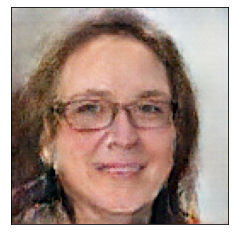

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


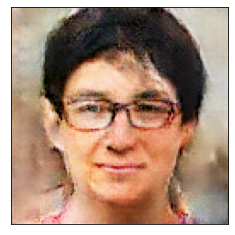

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


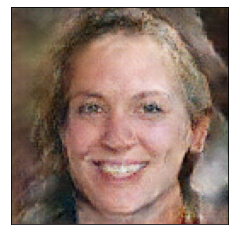

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


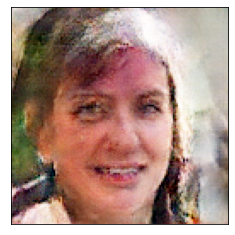

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


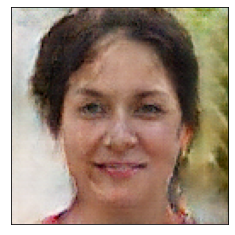

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


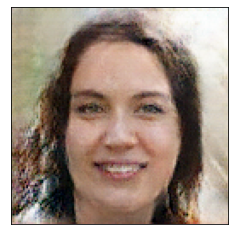

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


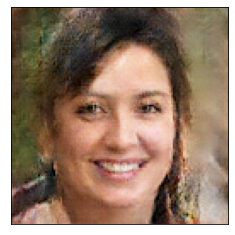

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


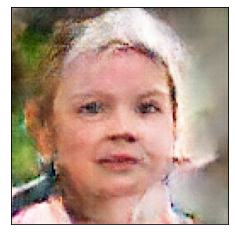

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


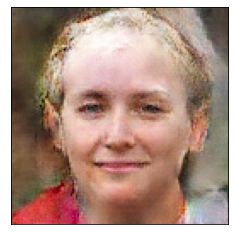

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


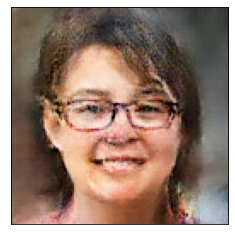

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


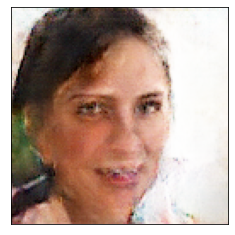

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


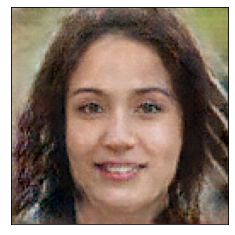

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


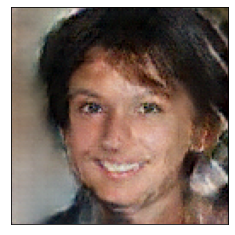

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


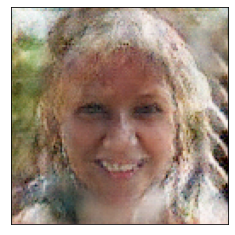

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


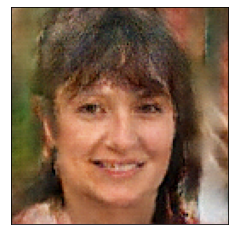

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


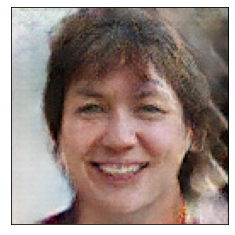

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


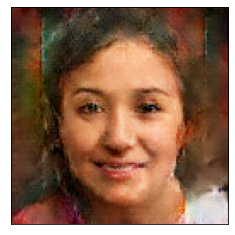

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


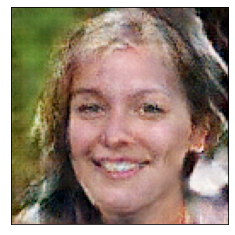

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


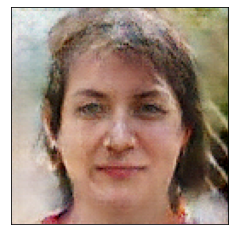

In [ ]:
#latent_space_samples = torch.randn(batch_size, 100).to(device=device)
 #image display
latent = torch.randn(latent_size, latent_size, 1, 1, device=device)
generated_samples = generator(latent)
generated_samples = generated_samples.cpu().detach()
for i in generated_samples:

  plt.imshow(i.permute(1,2,0))
  plt.xticks([])
  plt.yticks([])
  plt.show()